<center>
    <img src="https://weclouddata.s3.amazonaws.com/images/logos/wcd_logo_new_2.png" width='30%'> 
</center>

----------

<h1 align="center"> Case Study - Telecom Churn </h1>
<br>
<center align="left"> <font size='4'>  Developed by: </font><font size='4' color='#33AAFBD'>WeCloudData Academy </font></center>
<br>

----------

### Customer churn prediction: Telecom Churn Dataset
Customer churn, also known as customer retention, customer turnover, or customer defection, is the loss of clients or customers.

Telephone service companies, Internet service providers, pay TV companies, insurance firms, and alarm monitoring services, often use customer attrition analysis and customer attrition rates as one of their key business metrics because the cost of retaining an existing customer is far less than acquiring a new one. Companies from these sectors often have customer service branches which attempt to win back defecting clients, because recovered long-term customers can be worth much more to a company than newly recruited clients.

Companies usually make a distinction between voluntary churn and involuntary churn. Voluntary churn occurs due to a decision by the customer to switch to another company or service provider, involuntary churn occurs due to circumstances such as a customer's relocation to a long-term care facility, death, or the relocation to a distant location. In most applications, involuntary reasons for churn are excluded from the analytical models. Analysts tend to concentrate on voluntary churn, because it typically occurs due to factors of the company-customer relationship which companies control, such as how billing interactions are handled or how after-sales help is provided.

predictive analytics use churn prediction models that predict customer churn by assessing their propensity of risk to churn. Since these models generate a small prioritized list of potential defectors, they are effective at focusing customer retention marketing programs on the subset of the customer base who are most vulnerable to churn.

#### About Telecom Churn Dataset

Each row represents a customer; each column contains customer’s attributes.
The datasets have the following attributes or features:

- State: string
- Account length: integer
- Area code: integer
- International plan: string
- Voice mail plan: string
- Number vmail messages: integer
- Total day minutes: double
- Total day calls: integer
- Total day charge: double
- Total eve minutes: double
- Total eve calls: integer
- Total eve charge: double
- Total night minutes: double
- Total night calls: integer
- Total night charge: double
- Total intl minutes: double
- Total intl calls: integer
- Total intl charge: double
- Customer service calls: integer
- Churn: string
- The "churn-bigml-80" dataset contains 2666 rows (customers) and 20 columns (features).
- The "Churn" column is the target to predict.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from category_encoders import CountEncoder,OneHotEncoder,TargetEncoder
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, accuracy_score
from sklearn.metrics import accuracy_score,classification_report,roc_auc_score
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from scipy.stats import shapiro
from pandas_profiling import ProfileReport


%matplotlib inline

/var/folders/kp/sndy1z714b36d8j4h21ggmym0000gn/T/ipykernel_56611/2616984886.py:23: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [2]:
df = pd.read_csv('./churn-bigml-80.csv')

In [3]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


## Exploratory Data Analysis (EDA)

In [4]:
profile = ProfileReport(df)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [7]:
df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [8]:
# check normal distribution
features = df.drop(columns=['State','International plan','Voice mail plan','Churn'])
not_normal_columns = [] # get outliers columns for treatment
for column in features.columns:
    statistic, p_value = shapiro(df[column])
    alpha = 0.05
    print(column)
    if p_value > alpha:
        print("The column is normally distributed.")
    else:
        print("The column is not normally distributed.")
        not_normal_columns.append(column)

Account length
The column is not normally distributed.
Area code
The column is not normally distributed.
Number vmail messages
The column is not normally distributed.
Total day minutes
The column is normally distributed.
Total day calls
The column is not normally distributed.
Total day charge
The column is normally distributed.
Total eve minutes
The column is normally distributed.
Total eve calls
The column is not normally distributed.
Total eve charge
The column is normally distributed.
Total night minutes
The column is normally distributed.
Total night calls
The column is normally distributed.
Total night charge
The column is normally distributed.
Total intl minutes
The column is not normally distributed.
Total intl calls
The column is not normally distributed.
Total intl charge
The column is not normally distributed.
Customer service calls
The column is not normally distributed.


In [4]:
# check normal distribution
features = df.drop(columns=['State','International plan','Voice mail plan','Churn'])
not_normal_columns = [] # get outliers columns for treatment
for column in features.columns:
    statistic, p_value = shapiro(df[column])
    alpha = 0.05
    print(column)
    if p_value < alpha:
        print("The column is not normally distributed.")
        not_normal_columns.append(column)
    else:
        print("The column is normally distributed.")

Account length
The column is not normally distributed.
Area code
The column is not normally distributed.
Number vmail messages
The column is not normally distributed.
Total day minutes
The column is normally distributed.
Total day calls
The column is not normally distributed.
Total day charge
The column is normally distributed.
Total eve minutes
The column is normally distributed.
Total eve calls
The column is not normally distributed.
Total eve charge
The column is normally distributed.
Total night minutes
The column is normally distributed.
Total night calls
The column is normally distributed.
Total night charge
The column is normally distributed.
Total intl minutes
The column is not normally distributed.
Total intl calls
The column is not normally distributed.
Total intl charge
The column is not normally distributed.
Customer service calls
The column is not normally distributed.


In [9]:
# check categorical features value distribution
df['State'].value_counts()

WV    88
MN    70
NY    68
VA    67
AL    66
OH    66
WY    66
OR    62
NV    61
WI    61
MD    60
UT    60
CO    59
CT    59
MI    58
VT    57
ID    56
NC    56
TX    55
FL    54
IN    54
MT    53
OK    52
MA    52
KS    52
MO    51
DE    51
NJ    50
SC    49
SD    49
ME    49
GA    49
RI    48
MS    48
WA    48
AR    47
IL    45
DC    45
AZ    45
NE    45
HI    44
NM    44
ND    44
AK    43
KY    43
NH    43
TN    41
IA    38
PA    36
LA    35
CA    24
Name: State, dtype: int64

In [10]:
df['International plan'].value_counts()

No     2396
Yes     270
Name: International plan, dtype: int64

In [11]:
df['Voice mail plan'].value_counts()

No     1933
Yes     733
Name: Voice mail plan, dtype: int64

In [12]:
df['Churn'].value_counts()

False    2278
True      388
Name: Churn, dtype: int64

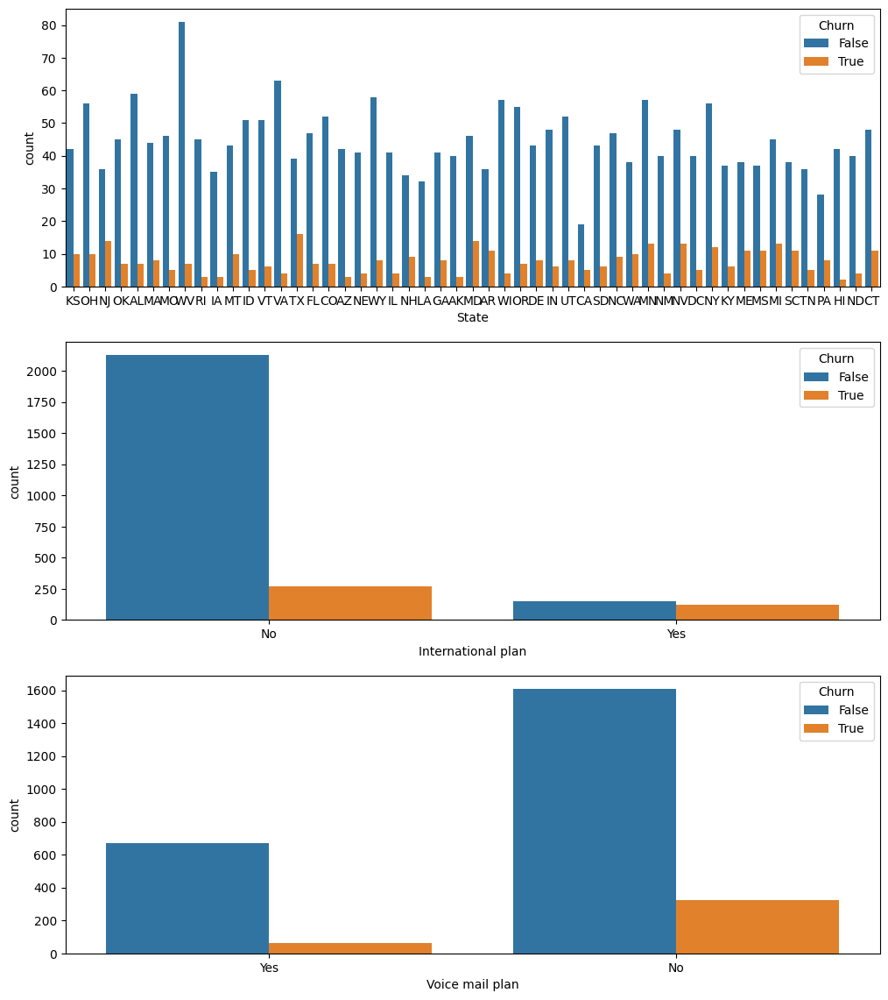

In [5]:
columns = ['State','International plan','Voice mail plan']
fig, axarr = plt.subplots(nrows=len(columns),figsize=(12, 14))

for i, col in enumerate(columns):
    sns.countplot(x=col, hue = 'Churn',data = df[[col,'Churn']],ax=axarr[i])

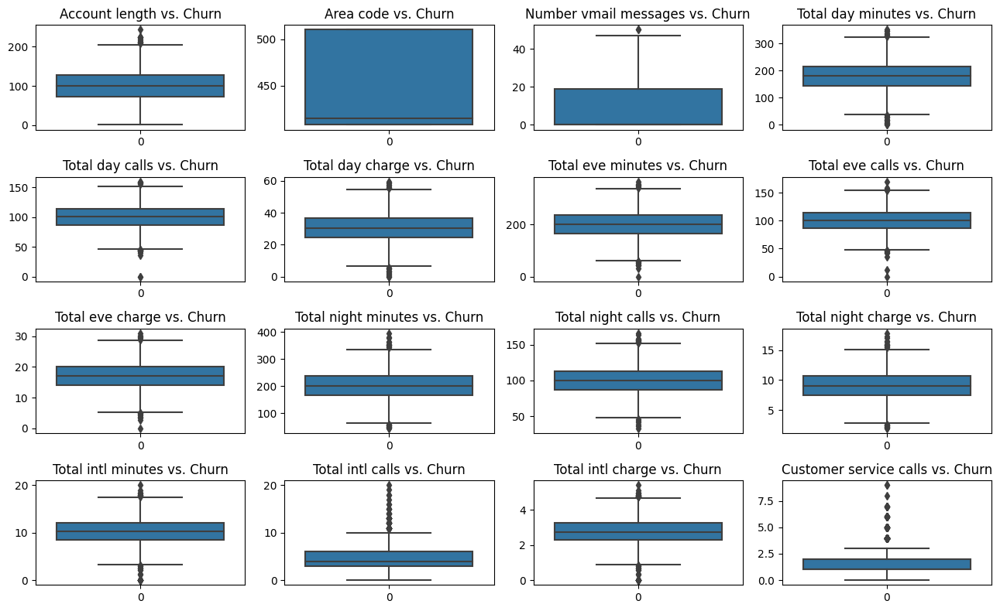

In [21]:
features = df.drop(columns=['State','International plan','Voice mail plan','Churn'])
# numeric_cols = ['Account length', 'Number vmail messages', 'Total day minutes', 'Total day calls',
#                 'Total eve minutes', 'Total eve calls', 'Total night minutes', 'Total night calls',
#                 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls']
plt.figure(figsize=(13,8))
for i, col in enumerate(features.columns):
    plt.subplot(4,4,i+1)
    sns.boxplot(data = features[col])
    plt.title(f'{col} vs. Churn')
plt.tight_layout()
plt.show()

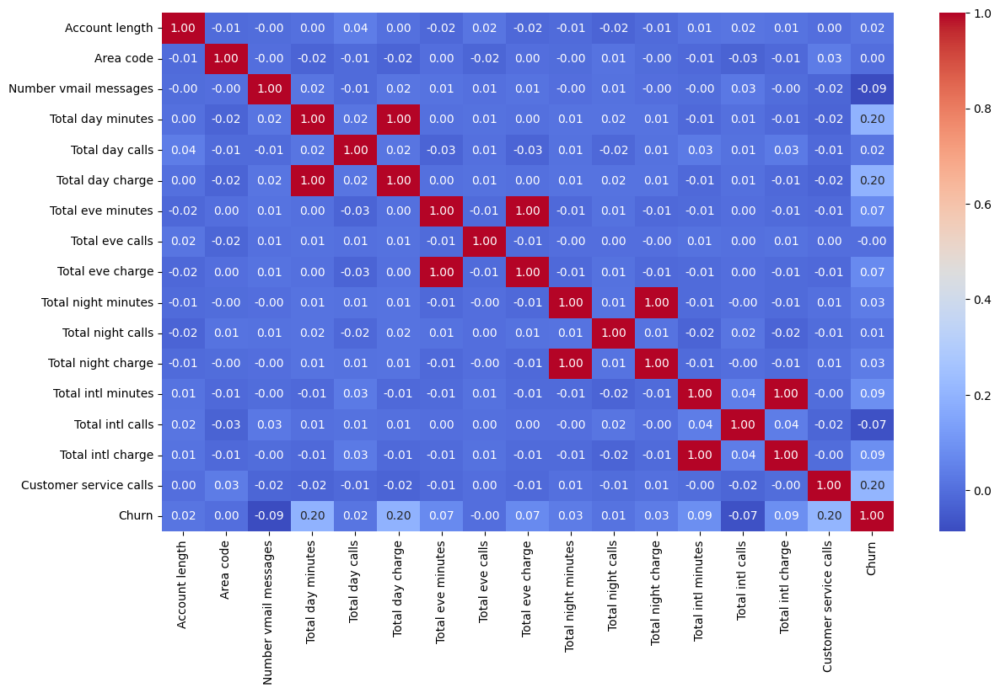

In [29]:
# Heatmap to see correlations between each column for outlier replaced dataset
features = df.drop(columns=['State','International plan','Voice mail plan'])

# sns.heatmap(features.corr(),annot=False)
plt.figure(figsize=(14,8))
sns.heatmap(features.corr(),annot=True,cmap='coolwarm',fmt='.2f');

## Baseline model

In [582]:
X = df.drop(columns=['State','Churn'])
X = pd.get_dummies(X,drop_first=True)
y = df['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

lr = LogisticRegression(random_state=42)
dt = DecisionTreeClassifier(max_depth=10,random_state=42)

lr.fit(X_train, y_train)
dt.fit(X_train, y_train)

print('Logistic Regression', lr.score(X_test, y_test))
print('Decision Tree', dt.score(X_test, y_test))

Logistic Regression 0.8556818181818182
Decision Tree 0.9306818181818182


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


In [583]:
print(classification_report(y_test, lr.predict(X_test)))
print(f'The ROC_AUC score is: {roc_auc_score(y_test,lr.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.86      0.99      0.92       751
        True       0.57      0.06      0.11       129

    accuracy                           0.86       880
   macro avg       0.72      0.53      0.52       880
weighted avg       0.82      0.86      0.80       880

The ROC_AUC score is: 0.5270130781696756


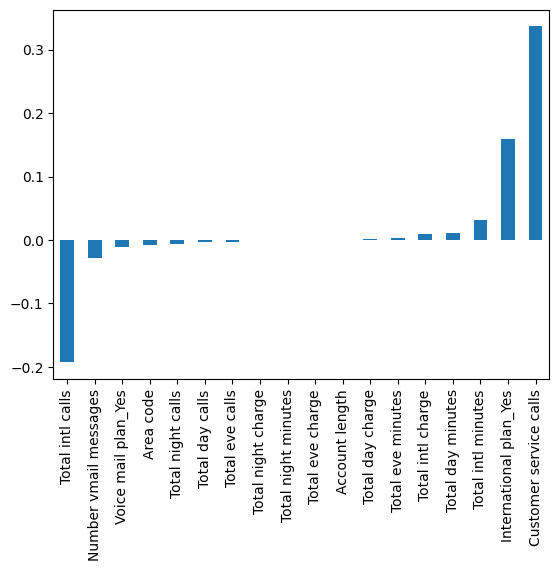

In [584]:
pd.Series(lr.coef_[0], index=X.columns).sort_values().plot(kind='bar');

In [585]:
print(classification_report(y_test, dt.predict(X_test)))
print(f'The ROC_AUC score is: {roc_auc_score(y_test,dt.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.94      0.98      0.96       751
        True       0.83      0.67      0.74       129

    accuracy                           0.93       880
   macro avg       0.89      0.82      0.85       880
weighted avg       0.93      0.93      0.93       880

The ROC_AUC score is: 0.8213493120284066


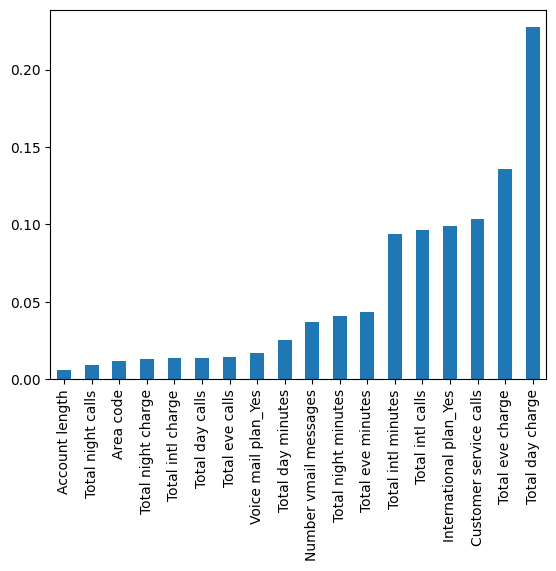

In [586]:
pd.Series(dt.feature_importances_, index=X.columns).sort_values().plot(kind='bar');

In [587]:
# XGBoost for the baseline model
from xgboost import XGBClassifier

xgb = XGBClassifier(random_state=42)

xgb.fit(X_train, y_train)

xgb.score(X_test, y_test)

0.9545454545454546

In [588]:
print(classification_report(y_test, xgb.predict(X_test)))
print(f'The ROC_AUC score is: {roc_auc_score(y_test,xgb.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.96      0.99      0.97       751
        True       0.94      0.74      0.83       129

    accuracy                           0.95       880
   macro avg       0.95      0.86      0.90       880
weighted avg       0.95      0.95      0.95       880

The ROC_AUC score is: 0.8642223804952569


## Imbalanced data

In [651]:
X = df.drop(columns=['State','Churn'])
X = pd.get_dummies(X,drop_first=True)
y = df['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2,
                                                      random_state=42, stratify=y)

In [652]:
smt = SMOTE(random_state=42)

In [653]:
# see the result after applying the SMOTE
# Use pipeline to do split,scaler and smote

pipe = Pipeline([
    ('smote',smt),
    ('logistic_regression', lr)
])

pipe.fit(X_train,y_train)
pipe.score(X_test, y_test)

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


0.6685393258426966

In [654]:
print(classification_report(y_test, pipe.predict(X_test)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test,pipe.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.91      0.68      0.78       456
        True       0.24      0.60      0.35        78

    accuracy                           0.67       534
   macro avg       0.58      0.64      0.56       534
weighted avg       0.81      0.67      0.71       534

The AUC_ROC score is: 0.6411943319838056


In [655]:
pipe = Pipeline([
    ('smote',smt),
    ('decision_tree', DecisionTreeClassifier(random_state=42))
])

pipe.fit(X_train,y_train)
pipe.score(X_test, y_test)

0.8595505617977528

In [656]:
print(classification_report(y_test, pipe.predict(X_test)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test,pipe.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.94      0.89      0.92       456
        True       0.51      0.68      0.59        78

    accuracy                           0.86       534
   macro avg       0.73      0.78      0.75       534
weighted avg       0.88      0.86      0.87       534

The AUC_ROC score is: 0.784919028340081


In [594]:
pipe = Pipeline([
    ('smote',smt),
    ('xgb', xgb)
])

pipe.fit(X_train,y_train)
pipe.score(X_test, y_test)

0.9250936329588015

In [595]:
print(classification_report(y_test, pipe.predict(X_test)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test,pipe.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.95      0.96      0.96       456
        True       0.76      0.71      0.73        78

    accuracy                           0.93       534
   macro avg       0.86      0.83      0.84       534
weighted avg       0.92      0.93      0.92       534

The AUC_ROC score is: 0.8339237516869097


### Data Preprocessing

In [657]:
# check area code column has three unique value, so decided to change to categorical type
# and use one-hot to encode it 
df['Area code'].value_counts()

415    1318
510     679
408     669
Name: Area code, dtype: int64

In [658]:
df['Area code'] = df['Area code'].astype('str')

<Axes: xlabel='Area code', ylabel='count'>

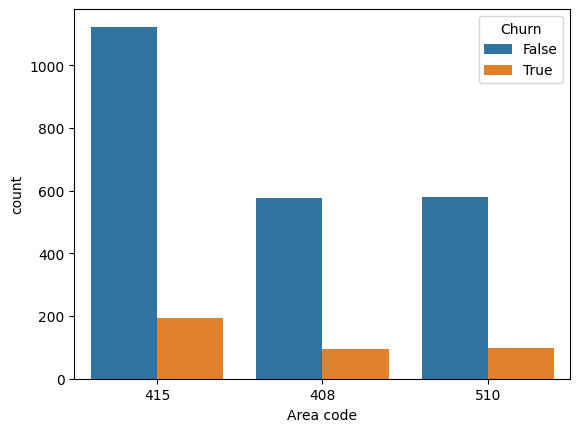

In [659]:
sns.countplot(x='Area code', hue = 'Churn',data = df[['Area code','Churn']])

In [660]:
one_hot_columns = ['Area code','International plan','Voice mail plan']

##### Handle Outliers

In [347]:
# define a function to handle outliers
# def outlier_remove (dataframe, column_name):
#     q1 = dataframe[column_name].quantile(0.25)
#     q3 = dataframe[column_name].quantile(0.75)
#     lower = q1 - 1.5 * (q3 - q1)
#     upper = q3 + 1.5 * (q3 - q1)
#     dataframe[column_name] = np.clip(dataframe[column_name],lower,upper)
#     return dataframe[column_name]

In [348]:
# features = df.drop(columns=['State','International plan','Voice mail plan','Churn','Area code'])
# for i in features.columns.tolist():
#     outlier_remove(df,i)

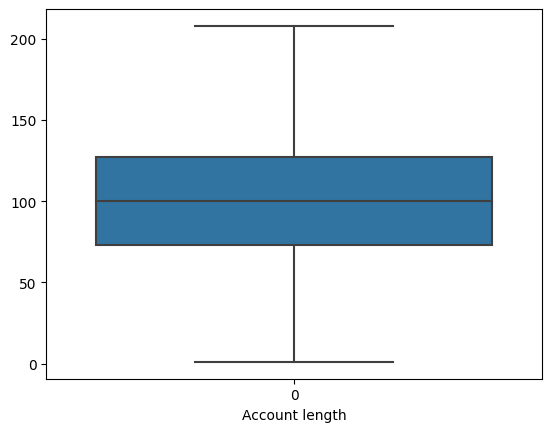

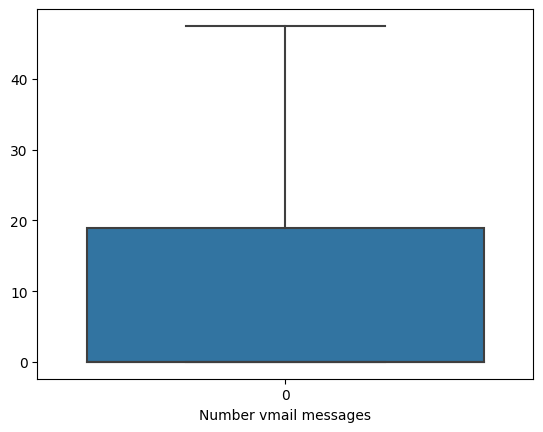

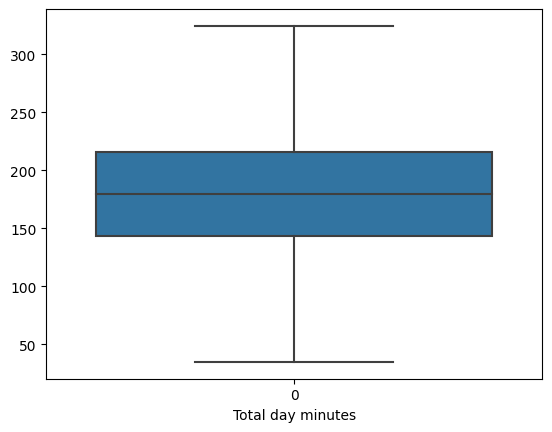

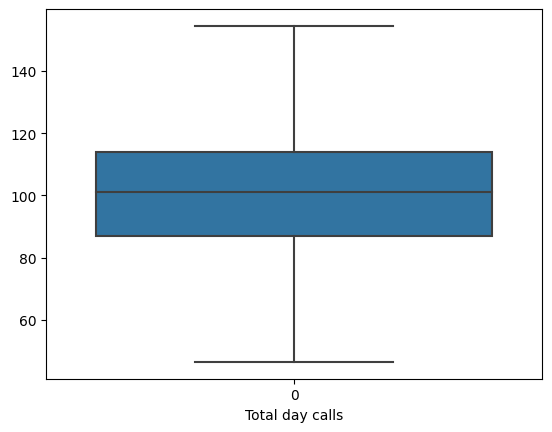

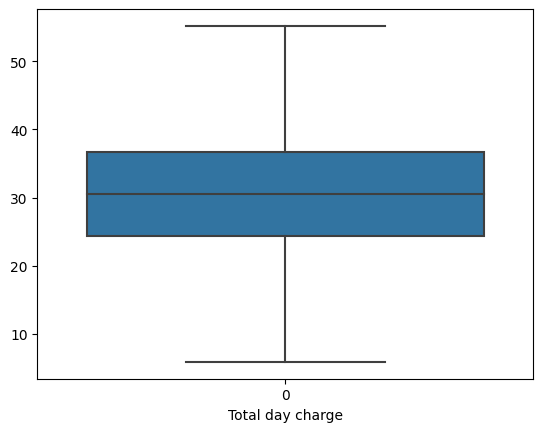

...

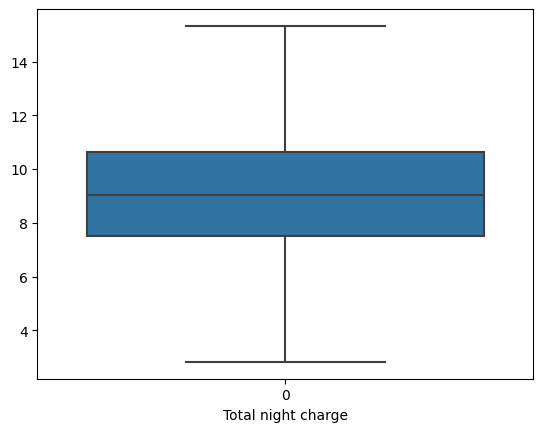

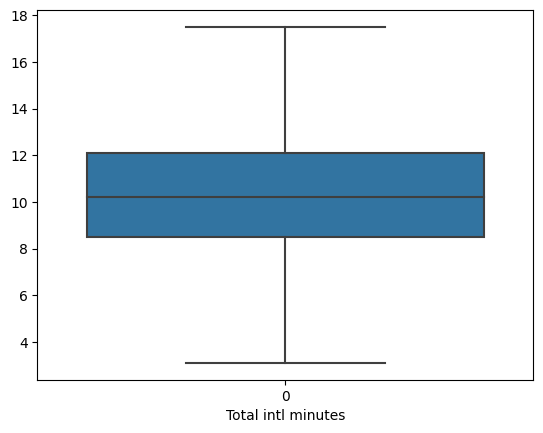

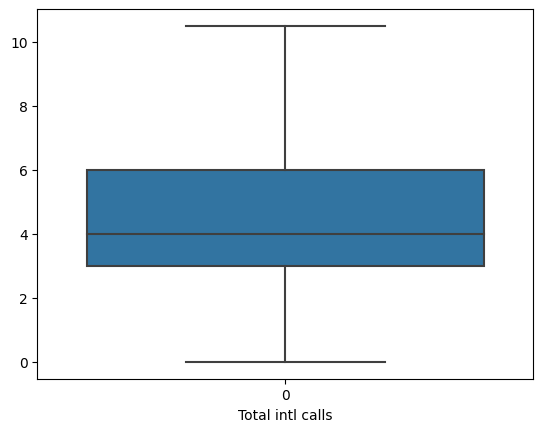

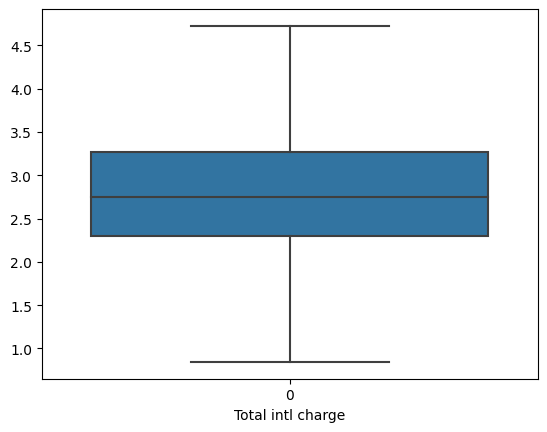

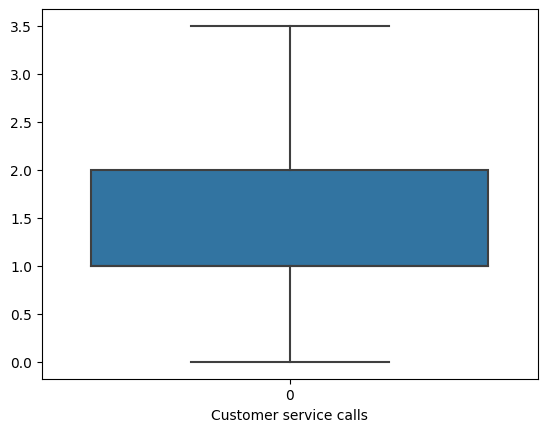

In [349]:
# # check outliers
# for i, col in enumerate(features.columns):
#     plt.figure(i)
#     gf = sns.boxplot(data = df[col])
#     gf.set_xlabel(col)

### Feature Engineering

In [190]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False


In [661]:
#try to create a new column called total_calls
df['total_calls'] = df['Total day calls'] + df['Total eve calls'] + df['Total night calls'] + df['Total intl calls']
df_new = df.drop(['Total day calls','Total eve calls','Total night calls','Total intl calls'],axis = 1)

In [662]:
# set columns for highly correlated and drop them later
columns_to_drop = ['Total day minutes','Total eve minutes','Total night minutes','Total intl minutes']

In [663]:
df_new.drop(columns=columns_to_drop,axis=1,inplace=True)

In [664]:
# train_test split
# Set dataset
X = df_new.drop(columns=['Churn','Account length'])
y = df_new['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

#### Feature encoding

In [665]:
count_encoder = CountEncoder(cols=['State','Customer service calls'])
one_code = OneHotEncoder(cols=one_hot_columns)

In [666]:
# apply Standardscaler
scaler = StandardScaler()

In [667]:
# define steps for pipeline
steps = [
    ('countencode',count_encoder),
    ('onehot',one_code),
    ('scaler',scaler),
    ('smote',smt),
    ('lr',lr)
]

In [668]:
pipeline = Pipeline(steps=steps)

In [669]:
pipeline.fit(X_train,y_train)

Pipeline(steps=[('countencode',
                 CountEncoder(cols=['State', 'Customer service calls'],
                              combine_min_nan_groups=True)),
                ('onehot',
                 OneHotEncoder(cols=['Area code', 'International plan',
                                     'Voice mail plan'])),
                ('scaler', StandardScaler()), ('smote', SMOTE(random_state=42)),
                ('lr', LogisticRegression(random_state=42))])

In [670]:
print(classification_report(y_test, pipeline.predict(X_test)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test,pipeline.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.93      0.78      0.84       751
        True       0.33      0.64      0.43       129

    accuracy                           0.76       880
   macro avg       0.63      0.71      0.64       880
weighted avg       0.84      0.76      0.78       880

The AUC_ROC score is: 0.7059785918516913


In [671]:
# define steps for pipeline using DecissionTree Algorithm
steps = [
    ('countencode',count_encoder),
    ('onehot',one_code),
    ('scaler',scaler),
    ('smote',smt),
    ('dt',dt)
]
pipeline = Pipeline(steps=steps)
pipeline.fit(X_train,y_train)

Pipeline(steps=[('countencode',
                 CountEncoder(cols=['State', 'Customer service calls'],
                              combine_min_nan_groups=True)),
                ('onehot',
                 OneHotEncoder(cols=['Area code', 'International plan',
                                     'Voice mail plan'])),
                ('scaler', StandardScaler()), ('smote', SMOTE(random_state=42)),
                ('dt', DecisionTreeClassifier(max_depth=10, random_state=42))])

In [672]:
print(classification_report(y_test, pipeline.predict(X_test)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test,pipeline.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.94      0.92      0.93       751
        True       0.60      0.66      0.63       129

    accuracy                           0.89       880
   macro avg       0.77      0.79      0.78       880
weighted avg       0.89      0.89      0.89       880

The AUC_ROC score is: 0.7915079635421504


In [673]:
# define steps for pipeline using XGBoost Algorithm
steps = [
    ('countencode',count_encoder),
    ('onehot',one_code),
    ('scaler',scaler),
    ('smote',smt),
    ('xgb',xgb)
]
pipeline = Pipeline(steps=steps)
pipeline.fit(X_train,y_train)

Pipeline(steps=[('countencode',
                 CountEncoder(cols=['State', 'Customer service calls'],
                              combine_min_nan_groups=True)),
                ('onehot',
                 OneHotEncoder(cols=['Area code', 'International plan',
                                     'Voice mail plan'])),
                ('scaler', StandardScaler()), ('smote', SMOTE(random_state=42)),
                ('xgb',
                 XGBClassifier(base_score=None, booster='gbtree',
                               callbacks=None, colsample_bylevel=None,
                               colsa...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=12, max_leaves=1,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=10,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=42, ...))])

In [674]:
print(classification_report(y_test, pipeline.predict(X_test)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test,pipeline.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.95      0.95      0.95       751
        True       0.72      0.73      0.72       129

    accuracy                           0.92       880
   macro avg       0.84      0.84      0.84       880
weighted avg       0.92      0.92      0.92       880

The AUC_ROC score is: 0.8397072637000795


In [613]:
# Using Random Forest
randomForest = RandomForestClassifier(random_state=42)
steps = [
    ('countencode',count_encoder),
    ('onehot',one_code),
    ('scaler',scaler),
    ('smote',smt),
    ('random',randomForest)
]
pipeline = Pipeline(steps=steps)
pipeline.fit(X_train,y_train)

Pipeline(steps=[('countencode',
                 CountEncoder(cols=['State', 'Customer service calls'],
                              combine_min_nan_groups=True)),
                ('onehot',
                 OneHotEncoder(cols=['Area code', 'International plan',
                                     'Voice mail plan'])),
                ('scaler', StandardScaler()), ('smote', SMOTE(random_state=42)),
                ('random', RandomForestClassifier(random_state=42))])

In [614]:
print(classification_report(y_test, pipeline.predict(X_test)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test,pipeline.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.94      0.95      0.95       751
        True       0.70      0.64      0.67       129

    accuracy                           0.91       880
   macro avg       0.82      0.80      0.81       880
weighted avg       0.91      0.91      0.91       880

The AUC_ROC score is: 0.7984031627081205


In [675]:
# try the same for charges columns to see the result changes
df_new['total_charges'] = df_new['Total day charge'] + df_new['Total eve charge'] + df_new['Total night charge'] + df_new['Total intl charge']
df_new = df_new.drop(['Total day charge','Total eve charge','Total night charge','Total intl charge'],axis = 1)

In [676]:
X = df_new.drop(columns=['Churn'])
y = df_new['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

count_encoder = CountEncoder(cols=['State','Account length','Customer service calls'])
one_code = OneHotEncoder(cols=one_hot_columns)

# define steps for pipeline
steps = [
    ('countencode',count_encoder),
    ('onehot',one_code),
    ('scaler',scaler),
    ('smote',smt),
    ('xgb',xgb)
]
pipeline = Pipeline(steps=steps)
pipeline.fit(X_train,y_train)

Pipeline(steps=[('countencode',
                 CountEncoder(cols=['State', 'Account length',
                                    'Customer service calls'],
                              combine_min_nan_groups=True)),
                ('onehot',
                 OneHotEncoder(cols=['Area code', 'International plan',
                                     'Voice mail plan'])),
                ('scaler', StandardScaler()), ('smote', SMOTE(random_state=42)),
                ('xgb',
                 XGBClassifier(base_score=None, booster='gbtree',
                               callbacks=None, colsample_by...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=12, max_leaves=1,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=10,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=42, ...))])

In [677]:
print(classification_report(y_test, pipeline.predict(X_test)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test,pipeline.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.95      0.97      0.96       751
        True       0.78      0.72      0.75       129

    accuracy                           0.93       880
   macro avg       0.87      0.84      0.85       880
weighted avg       0.93      0.93      0.93       880

The AUC_ROC score is: 0.8431548632830644


In [618]:
# check RandomForest algorithm
steps = [
    ('countencode',count_encoder),
    ('onehot',one_code),
    ('scaler',scaler),
    ('smote',smt),
    ('random',randomForest)
]
pipeline = Pipeline(steps=steps)
pipeline.fit(X_train,y_train)

Pipeline(steps=[('countencode',
                 CountEncoder(cols=['State', 'Account length',
                                    'Customer service calls'],
                              combine_min_nan_groups=True)),
                ('onehot',
                 OneHotEncoder(cols=['Area code', 'International plan',
                                     'Voice mail plan'])),
                ('scaler', StandardScaler()), ('smote', SMOTE(random_state=42)),
                ('random', RandomForestClassifier(random_state=42))])

In [619]:
print(classification_report(y_test, pipeline.predict(X_test)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test,pipeline.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.96      0.97      0.96       751
        True       0.79      0.74      0.76       129

    accuracy                           0.93       880
   macro avg       0.87      0.85      0.86       880
weighted avg       0.93      0.93      0.93       880

The AUC_ROC score is: 0.8515725802289454


In [620]:
# Target encoding
from sklearn.compose import ColumnTransformer
target_columns = ['State','Customer service calls']
target_encoder = TargetEncoder(cols=target_columns)
one_code = OneHotEncoder(cols=one_hot_columns)

preprocessor = ColumnTransformer(
transformers=[
    ('target', target_encoder, target_columns),
    ('onehot', one_code, one_hot_columns)
])

steps = [
    ('preprocessor', preprocessor),
    ('scaler',scaler),
    ('smote',smt),
    ('xgb',xgb)
]

pipeline2 = Pipeline(steps=steps)
pipeline2.fit(X_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('target',
                                                  TargetEncoder(cols=['State',
                                                                      'Customer '
                                                                      'service '
                                                                      'calls']),
                                                  ['State',
                                                   'Customer service calls']),
                                                 ('onehot',
                                                  OneHotEncoder(cols=['Area '
                                                                      'code',
                                                                      'International '
                                                                      'plan',
                                                                      'Voice '
                                                                      'mail '
                                                                      'plan']),
                                                  ['Area code',
                                                   'International plan',
                                                   'Voice mail plan'])])),
                ('scaler', StandardScaler()), ('smote', SMOTE(ra...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=42, ...))])

In [621]:
print(classification_report(y_test, pipeline2.predict(X_test)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test,pipeline2.predict(X_test))}')

              precision    recall  f1-score   support

       False       0.89      0.93      0.91       751
        True       0.45      0.34      0.39       129

    accuracy                           0.84       880
   macro avg       0.67      0.63      0.65       880
weighted avg       0.83      0.84      0.83       880

The AUC_ROC score is: 0.6345905717441345


###### Worse result

### PCA

In [224]:
from sklearn.decomposition import PCA

##### Try to use one-hot to encode all the categorical features, and use PCA to decomposite all the features, then train the model

In [622]:
df_pca = df.drop('total_calls',axis = 1)

In [623]:
oh_columns =['State','Area code','International plan','Voice mail plan']
df_pca = pd.get_dummies(df_pca)

In [624]:
X_pca = df_pca.drop(columns=['Account length','Churn'])
y_pca = df['Churn']

X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y_pca, test_size=0.33, random_state=42)

In [625]:
# Scaling
X_train_pca_scale = scaler.fit_transform(X_train_pca)
X_test_pca_scale = scaler.transform(X_test_pca)

In [626]:
# balancing data
X_train_resampled,y_train_resampled = smt.fit_resample(X_train_pca_scale,y_train_pca)

In [627]:
# PCA
# pca = PCA(random_state=42)
pca = PCA(48,random_state=42)
X_train_pca = pca.fit_transform(X_train_resampled)
X_test_pca = pca.transform(X_test_pca_scale)

In [628]:
# pca.explained_variance_ratio_

In [422]:
# after PCA the number of features remains the same
# len(X_train_pca[0])

In [629]:
xgb = XGBClassifier(random_state = 42)

In [630]:
xgb.fit(X_train_pca,y_train_resampled)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)

In [631]:
print(classification_report(y_test_pca, xgb.predict(X_test_pca)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test_pca,xgb.predict(X_test_pca))}')

              precision    recall  f1-score   support

       False       0.92      0.93      0.92       751
        True       0.56      0.51      0.53       129

    accuracy                           0.87       880
   macro avg       0.74      0.72      0.73       880
weighted avg       0.86      0.87      0.87       880

The AUC_ROC score is: 0.7211934474963615


#### Use PCA dased on the dataset that applying feature engineering, see the differences

In [632]:
df_new.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Customer service calls,Churn,total_calls,total_charges
0,KS,128,415,No,Yes,25,1,False,303,75.56
1,OH,107,415,No,Yes,26,1,False,332,59.24
2,NJ,137,415,No,No,0,0,False,333,62.29
3,OH,84,408,Yes,No,0,2,False,255,66.80
4,OK,75,415,Yes,No,0,3,False,359,52.09


In [633]:
# train_test split
# Set dataset
X = df_new.drop(columns=['Churn'])
y = df_new['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [634]:
count_encoder = CountEncoder(cols=['State','Account length','Customer service calls'])
one_code = OneHotEncoder(cols=one_hot_columns)

In [635]:
X_train = count_encoder.fit_transform(X_train)
X_test = count_encoder.transform(X_test)

In [636]:
X_train = one_code.fit_transform(X_train)
X_test = one_code.transform(X_test)

In [637]:
# apply Standardscaler
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [638]:
# define PCA
pca = PCA()
X_train_std_pca = pca.fit_transform(X_train_std)
X_test_std_pca = pca.transform(X_test_std)

In [639]:
# apply XGBoost algorithm
xgb = XGBClassifier(random_state = 42)
xgb.fit(X_train_std_pca, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)

In [640]:
print(classification_report(y_test, xgb.predict(X_test_std_pca)))
print(f'The AUC_ROC score is: {roc_auc_score(y_test,xgb.predict(X_test_std_pca))}')

              precision    recall  f1-score   support

       False       0.92      0.95      0.94       751
        True       0.67      0.53      0.59       129

    accuracy                           0.89       880
   macro avg       0.80      0.74      0.77       880
weighted avg       0.89      0.89      0.89       880

The AUC_ROC score is: 0.7448053757780324


In [641]:
# get to know how well each components “explains” the variance using explained_variance_ratio_ method
pca.explained_variance_ratio_

array([2.27499841e-01, 1.55474268e-01, 1.28013346e-01, 1.03899838e-01,
       8.10132707e-02, 7.69809117e-02, 7.62725481e-02, 7.44944336e-02,
       7.20766877e-02, 4.27485601e-03, 1.04955296e-31, 5.65955310e-32,
       1.73361262e-33])

## Hyperparameter Tunning

In [678]:
# hyperparameter tuning with XGBooster
parameters = {
    'xgb__n_estimators': [10, 30,50, 70],
    'xgb__max_leaves': [1, 3, 5, 7, 9],
    'xgb__max_depth': [5,7,9,12]
}

xgb_classifier = XGBClassifier(random_state = 42)

count_encoder = CountEncoder(cols=['State','Account length','Customer service calls'])
one_code = OneHotEncoder(cols=one_hot_columns)

# define steps for pipeline
steps = [
    ('countencode',count_encoder),
    ('onehot',one_code),
    ('scaler',scaler),
    ('smote',smt),
    ('xgb',xgb)
]

# use pipline
pipe = Pipeline(steps=steps)

gs = GridSearchCV(pipe, parameters, cv=5, scoring=['f1','roc_auc'], verbose=2, n_jobs=-1, refit='f1')

gs.fit(X_train, y_train)

Fitting 5 folds for each of 80 candidates, totalling 400 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('countencode',
                                        CountEncoder(cols=['State',
                                                           'Account length',
                                                           'Customer service '
                                                           'calls'],
                                                     combine_min_nan_groups=True)),
                                       ('onehot',
                                        OneHotEncoder(cols=['Area code',
                                                            'International '
                                                            'plan',
                                                            'Voice mail '
                                                            'plan'])),
                                       ('scaler', StandardScaler()),
                                       ('smote', SMOTE(random_state=42)),
                                       ('xgb',
                                        XGBClassifier(base_score=None,
                                                      booster='g...
                                                      max_delta_step=None,
                                                      max_depth=12,
                                                      max_leaves=1,
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      n_estimators=10,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      predictor=None,
                                                      random_state=42, ...))]),
             n_jobs=-1,
             param_grid={'xgb__max_depth': [5, 7, 9, 12],
                         'xgb__max_leaves': [1, 3, 5, 7, 9],
                         'xgb__n_estimators': [10, 30, 50, 70]},
             refit='f1', scoring=['f1', 'roc_auc'], verbose=2)

In [679]:
gs.best_params_

{'xgb__max_depth': 5, 'xgb__max_leaves': 1, 'xgb__n_estimators': 10}

In [680]:
gs.best_score_

0.7585760349433958

In [681]:
# retrain the model with hyperparameters
xgb = XGBClassifier(booster='gbtree',max_depth = 12,n_estimators=10,max_leaves=1,random_state = 42)

# use pipline
pipe = Pipeline(steps=steps)
pipe.fit(X_train,y_train)
y_pred_xg = pipe.predict(X_test)
print(classification_report(y_test, y_pred_xg))
print(roc_auc_score(y_test,y_pred_xg))

              precision    recall  f1-score   support

       False       0.95      0.97      0.96       751
        True       0.78      0.72      0.75       129

    accuracy                           0.93       880
   macro avg       0.87      0.84      0.85       880
weighted avg       0.93      0.93      0.93       880

0.8431548632830644


In [682]:
# hyperparameter tuning for RandomForest
parameters = {
    'forest__n_estimators': [10, 20,30,40,50, 70,100,150, 200],
    'forest__max_features': [1,2, 3, 4,5, 6,7,8, 9,10],
    'forest__max_depth': [1,3,5, 7, 10, 15]
}

forest = RandomForestClassifier(random_state=42)

# set steps for RandomForest algorithm
steps = [
    ('countencode',count_encoder),
    ('onehot',one_code),
    ('scaler',scaler),
    ('smote',smt),
    ('forest',forest)
]

# use pipline
pipe = Pipeline(steps=steps)

gs = GridSearchCV(pipe, parameters, cv=5, scoring=['f1', 'roc_auc'], verbose=2, n_jobs=-1, refit='f1')

gs.fit(X_train, y_train)

Fitting 5 folds for each of 540 candidates, totalling 2700 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('countencode',
                                        CountEncoder(cols=['State',
                                                           'Account length',
                                                           'Customer service '
                                                           'calls'],
                                                     combine_min_nan_groups=True)),
                                       ('onehot',
                                        OneHotEncoder(cols=['Area code',
                                                            'International '
                                                            'plan',
                                                            'Voice mail '
                                                            'plan'])),
                                       ('scaler', StandardScaler()),
                                       ('smote', SMOTE(random_state=42)),
                                       ('forest',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'forest__max_depth': [1, 3, 5, 7, 10, 15],
                         'forest__max_features': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                  10],
                         'forest__n_estimators': [10, 20, 30, 40, 50, 70, 100,
                                                  150, 200]},
             refit='f1', scoring=['f1', 'roc_auc'], verbose=2)

In [683]:
gs.best_params_

{'forest__max_depth': 7, 'forest__max_features': 6, 'forest__n_estimators': 10}

In [684]:
gs.best_score_

0.7673056464338605

In [691]:
# use the best hyperparameters to train the model
forest = RandomForestClassifier(n_estimators=50,max_depth=5,max_features=1,random_state=42)

# use pipline
steps = [
    ('countencode',count_encoder),
    ('onehot',one_code),
    ('scaler',scaler),
    ('smote',smt),
    ('forest',forest)
]

pipe = Pipeline(steps=steps)
pipe.fit(X_train,y_train)

# predict and get report
y_pred_rf = pipe.predict(X_test)
print(classification_report(y_test, y_pred_rf))
print(roc_auc_score(y_test,y_pred_rf))

              precision    recall  f1-score   support

       False       0.97      0.92      0.94       751
        True       0.63      0.81      0.71       129

    accuracy                           0.90       880
   macro avg       0.80      0.86      0.82       880
weighted avg       0.92      0.90      0.91       880

0.8624882585493244


In [720]:
len(X_test)

880

##### RandomForsest give me the higher recall ratio and the ROC_AUC score.

## Model Interpretation

In [577]:
# !pip install shap

In [ ]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor()

In [730]:
# get prepare the train set for decissiontree regressor under the surrogate model
count_encoder = CountEncoder(cols=['State','Account length','Customer service calls'])
one_code = OneHotEncoder(cols=one_hot_columns)

temp = count_encoder.fit_transform(X_train)
temp = one_code.fit_transform(temp)

X_temp,y_temp = smt.fit_resample(scaler.fit_transform(temp),y_train)

In [742]:
dt.fit(X_temp,forest.predict_proba(X_temp))

DecisionTreeRegressor()

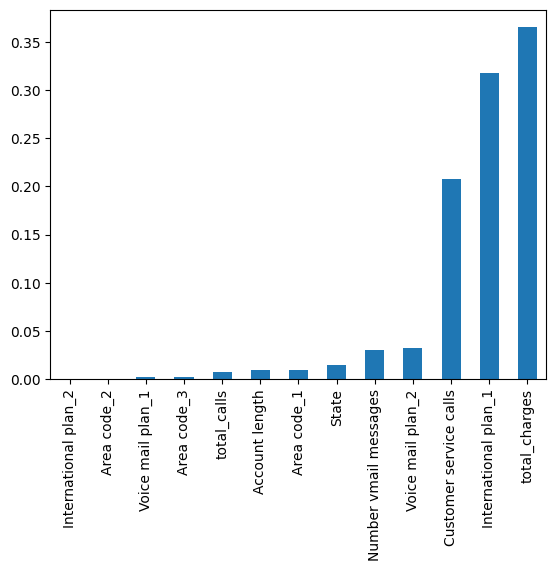

In [747]:
#plot the surrogate model
pd.Series(dt.feature_importances_, index=one_code.fit_transform(count_encoder.fit_transform(X_train)).columns).sort_values().plot(kind='bar');

In [ ]:
# import shap
# shap.initjs()

# explainer = shap.KernelExplainer(nn.predict_proba, X_train, link='logit')
# shap_values = explainer.shap_values(X_test, nsamples=100)

# shap.force_plot(explainer.expected_value[0], shap_values[0][0, :], X_test.iloc[0, :], link='logit')